# Khám phá dữ liệu

- Dữ liệu là tập dữ liệu về các luật Sở hữ trí tuệ trong bộ dataset [Thư viện Pháp Luật - huggingface](https://huggingface.co/datasets/sontungkieu/ThuVienPhapLuat).
  - Bộ dữ liệu có kích thước rất lớn, nhưng ở đây chúng em sử dụng một phần nhỏ của dữ liệu để thực hiện bài toán xây dựng Chatbot RAG để hỏi đáp.
- Tệp [vietnamese.txt](https://www.kaggle.com/code/mpwolke/vietnamese-stopwords-w2v/input?select=vietnamese.txt) chứa danh sách các stop word trong tiếng Việt. 
- Thư viện xử lý NLP dành cho Tiếng Việt [underthesea](https://magz.techover.io/2021/12/12/tong-quan-thu-vien-underthesea-bo-cong-cu-ma-nguon-mo-xu-ly-ngon-ngu-tu-nhien-tieng-viet/).

In [24]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import json
import re


import warnings
warnings.filterwarnings('ignore')
# Config matplotlib and pandas display
%matplotlib inline
pd.set_option('display.max_colwidth', 100)
pd.set_option('display.max_columns', None)

# Config seaborn
plt.rcParams["figure.figsize"] = [12, 8]
plt.rcParams['figure.facecolor'] = '#FFEDD8'
plt.rcParams['font.size'] = 10

In [25]:
# Load the data
input_file = "../ThuVienPhapLuat/So-huu-tri-tue.csv"

## I. Tiền xử lý

### 1.1 Load data

In [26]:
raw_df = pd.read_csv(input_file, encoding = 'utf-8')
raw_df.head(3)

,_id,category,danh_sach_bang,link,loai_van_ban,ngay_ban_hanh,ngay_cong_bao,ngay_hieu_luc,nguoi_ky,noi_ban_hanh,noi_dung,noi_dung_html,so_cong_bao,so_hieu,thuoc_tinh_html,tinh_trang,title,tom_tat,tom_tat_html,van_ban_duoc_dan
0,f1c1c0d00e744873e3ea1b7e1d06a55e,So-huu-tri-tue,"b'{""bang_0"":[{""TH\xe1\xbb\xa6 T\xc6\xaf\xe1\xbb\x9aNG CH\xc3\x8dNH PH\xe1\xbb\xa6 ----------"":...",https://thuvienphapluat.vn/van-ban/So-huu-tri-tue/Quyet-dinh-88-QD-TTg-nang-luc-quan-ly-thuc-thi...,Quyết định,20/01/2017,Đang cập nhật,Đã biết,Vũ Đức Đam,Thủ tướng Chính phủ,"<jsontable name=""bang_0""> </jsontable>\n \nQUYẾT ĐỊNH\nVỀ\r\nVIỆC PHÊ DUYỆT ĐỀ ÁN TĂNG CƯỜNG NĂN...","<div class=""content1"">\n<div>\n<div>\n<table border=""0"" cellpadding=""0"" cellspacing=""0"" style=""b...",Đang cập nhật,88/QĐ-TTg,"<table cellpadding=""2"" rules=""all"" style=""font-size: 11px; border: 1px solid #AFAFAF; line-heigh...",Đã biết,Quyết định 88/QĐ-TTg năm 2017 phê duyệt Đề án Tăng cường năng lực quản lý và thực thi có hiệu qu...,NaN,"<div class=""Tomtatvanban"">\n</div>","b'{""Ngh\xe1\xbb\x8b quy\xe1\xba\xbft 102/NQ-CP"":""https://thuvienphapluat.vn/van-ban/van-hoa-xa-h..."
1,68d8d481ab423aa90d37ab4ac99506fd,So-huu-tri-tue,"b'{""bang_0"":[{""\xe1\xbb\xa6Y BAN NH\xc3\x82N D\xc3\x82N T\xe1\xbb\x88NH NGH\xe1\xbb\x86 AN ---...",https://thuvienphapluat.vn/van-ban/So-huu-tri-tue/Quyet-dinh-320-QD-UBND-2017-phe-duyet-Chuong-t...,Quyết định,19/01/2017,Đang cập nhật,Đã biết,Huỳnh Thanh Điền,Tỉnh Nghệ An,"<jsontable name=""bang_0""> </jsontable>\n \nQUYẾT ĐỊNH\nPHÊ\r\nDUYỆT CHƯƠNG TRÌNH PHÁT TRIỂN TÀI ...","<div class=""content1"">\n<div>\n<div>\n<div>\n<table border=""0"" cellpadding=""0"" cellspacing=""0"" s...",Đang cập nhật,320/QĐ-UBND,"<table cellpadding=""2"" rules=""all"" style=""font-size: 11px; border: 1px solid #AFAFAF; line-heigh...",Đã biết,Quyết định 320/QĐ-UBND năm 2017 về phê duyệt Chương trình phát triển tài sản trí tuệ tỉnh Nghệ A...,NaN,"<div class=""Tomtatvanban"">\n</div>",b'{}'
2,5d811432d85b1eb39795981ad1462afa,So-huu-tri-tue,"b'{""bang_0"":[{""\xe1\xbb\xa6Y BAN NH\xc3\x82N D\xc3\x82N T\xe1\xbb\x88NH GIA LAI -------"":""S\xe1...",https://thuvienphapluat.vn/van-ban/So-huu-tri-tue/Quyet-dinh-160-QD-UBND-phe-duyet-danh-muc-nhie...,Quyết định,13/02/2015,Đang cập nhật,Đã biết,Phạm Thế Dũng,Tỉnh Gia Lai,"<jsontable name=""bang_0""> </jsontable>\n \nQUYẾT ĐỊNH\nVỀ VIỆC phê duyỆt Danh mỤc nhiỆm vỤ nghiê...","<div class=""content1"">\n<div><div>\n<div>\n<table border=""0"" cellpadding=""0"" cellspacing=""0"" sty...",Đang cập nhật,160/QĐ-UBND,"<table cellpadding=""2"" rules=""all"" style=""font-size: 11px; border: 1px solid #AFAFAF; line-heigh...",Đã biết,Quyết định 160/QĐ-UBND phê duyệt danh mục nhiệm vụ nghiên cứu và triển khai cấp tỉnh thực hiện t...,NaN,"<div class=""Tomtatvanban"">\n</div>",b'{}'


### 1.2 Những cái nhìn đầu tiên về dữ liệu

In [27]:
raw_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 488 entries, 0 to 487
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   _id               488 non-null    object
 1   category          488 non-null    object
 2   danh_sach_bang    488 non-null    object
 3   link              488 non-null    object
 4   loai_van_ban      488 non-null    object
 5   ngay_ban_hanh     488 non-null    object
 6   ngay_cong_bao     483 non-null    object
 7   ngay_hieu_luc     481 non-null    object
 8   nguoi_ky          488 non-null    object
 9   noi_ban_hanh      488 non-null    object
 10  noi_dung          488 non-null    object
 11  noi_dung_html     488 non-null    object
 12  so_cong_bao       483 non-null    object
 13  so_hieu           488 non-null    object
 14  thuoc_tinh_html   488 non-null    object
 15  tinh_trang        483 non-null    object
 16  title             488 non-null    object
 17  tom_tat         

**Giải thích ý nghĩa các cột trong dữ liệu cùng với định dạng của nó**

- `category` : loại luật, trong bài dữ liệu này chỉ lấy mỗi loại luật Sở hữu trí tuệ (nên cột này không cần thiết nữa)
- `danh_sach_bang`:  dữ liệu được mã hóa theo định dạng JSON nhưng sử dụng ký tự bytes (dạng byte)
- `link`: Đường dẫn đến trang web chứa nội dung luật tại Thư viện Pháp luật
- `loai_van_ban`: loại văn bản (Quyết đinh, Luật, Nghị định, Thông tư, ...)
- `ngay_ban_hanh`: ngày ban hành văn bản
- `ngay_cong_bo`: ngày công bố văn bản
- `ngay_hieu_luc`: ngày hiệu lực văn bản
- `nguoi_ky`: Người ký
- `noi_ban_hanh`: Nơi ban hành cụ thể
- `noi_dung`: nội dung văn bản nhưng có những phần bảng phải link với danh_sach_bang
- `noi_dung_html`: nội dung văn bản dạng html
- `so_cong_bao`: số công báo
- `so_hieu`: số hiệu của văn bản
- `thuoc_tinh_html`: các thuộc tinh của các thẻ
- `tinh_trang`: Tình trạng văn bản
- `title`: tiêu đe văn bản
- `tom_tat`: tóm tắt văn bản
- `tom_tat_html`: tóm tắt văn bản dạng html
- `van_ban_duoc_dan`: những văn bản được trích dẫn và mã hoá dưới dạng JSON


**Nhận xét:**
- Một số cột có giá trị null nhiều và không có giá trị cần được xoá đi như: '_id', 'category', 'noi_dung_html', 'thuoc_tinh_html', 'tinh_trang', 'tom_tat', 'tom_tat_html'.

### 1.3 Xoá những cột không cần thiết

In [29]:
# tình trạng value counts
raw_df['tinh_trang'].value_counts()

tinh_trang
Đã biết    483
Name: count, dtype: int64

In [30]:
# xoá các cột không cần thiết
raw_df = raw_df.drop(['_id', 'category', 'noi_dung_html', 'thuoc_tinh_html', 'tinh_trang', 'tom_tat', 'tom_tat_html'], axis=1)

### 1.4 Xử lý dữ liệu thiếu

In [31]:
# xoá dữ liệu trùng lặp
n_duplicates = raw_df.duplicated().sum()
if n_duplicates > 0:
    raw_df = raw_df.drop_duplicates()
    print(f"Xoá {n_duplicates} dòng dữ liệu trùng lặp.")

Xoá 83 dòng dữ liệu trùng lặp.


In [32]:
# Thống kê dữ liệu thiếu từng cột
missing_data = raw_df.isnull().sum()
missing_data = missing_data[missing_data > 0]
# tính tỉ lệ % và sort 
missing_data = missing_data.sort_values(ascending=False)
missing_data = missing_data / len(raw_df) * 100
missing_data

ngay_hieu_luc    1.728395
ngay_cong_bao    0.740741
so_cong_bao      0.740741
dtype: float64

In [33]:
raw_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 405 entries, 0 to 487
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   danh_sach_bang    405 non-null    object
 1   link              405 non-null    object
 2   loai_van_ban      405 non-null    object
 3   ngay_ban_hanh     405 non-null    object
 4   ngay_cong_bao     402 non-null    object
 5   ngay_hieu_luc     398 non-null    object
 6   nguoi_ky          405 non-null    object
 7   noi_ban_hanh      405 non-null    object
 8   noi_dung          405 non-null    object
 9   so_cong_bao       402 non-null    object
 10  so_hieu           405 non-null    object
 11  title             405 non-null    object
 12  van_ban_duoc_dan  405 non-null    object
dtypes: object(13)
memory usage: 44.3+ KB


- parse lại những nội dung được mã hoá dưới dạng JSON như: 'danh_sach_bang', 'van_ban_duoc_dan'.

In [9]:
# Mã hoá lại dữ liệu json bị mã hoá
def decode_json(json_data):
        # Nếu json_data là chuỗi có tiền tố b'', loại bỏ tiền tố và chuyển sang bytes
    if isinstance(json_data, str) and (json_data.startswith("b'") or json_data.startswith('b"')):
        # Loại bỏ b'' và decode bằng unicode_escape sau đó chuyển thành UTF-8
        json_data = json_data[2:-1].encode("latin1").decode("unicode_escape").encode("latin1").decode("utf-8")

    # Chuyển JSON string sang dictionary
    try:
        data = json.loads(json_data)
    except json.JSONDecodeError as e:
        print(f"JSON Decode Error: {e}")
        data = {}
    return data

# Hàm format table
def format_table(table_data):
    formatted_text = ""
    for row in table_data:
        formatted_text += "\n\n".join(f"{key}: {value}" for key, value in row.items())
    return formatted_text or ""

def process_content(row):
    json_data = row['danh_sach_bang']
    content = row['noi_dung']

    data = decode_json(json_data)

    # Thay thế từng bảng vào vị trí placeholder
    for table_name, table_content in data.items():
        table_str = format_table(table_content)
        content = re.sub(f'<jsontable name="{table_name}"> </jsontable>', table_str, content)

    return content


In [10]:
raw_df['noi_dung_day_du'] = raw_df.apply(process_content, axis=1)

In [11]:
print(decode_json(raw_df['van_ban_duoc_dan'][0]))

{'Nghị quyết 102/NQ-CP': 'https://thuvienphapluat.vn/van-ban/van-hoa-xa-hoi/nghi-quyet-102-nq-cp-2014-chuong-trinh-hanh-dong-thuc-hien-33-nq-tw-phat-trien-van-hoa-con-nguoi-263143.aspx'}


In [12]:
raw_df['van_ban_duoc_dan'] = raw_df['van_ban_duoc_dan'].apply(decode_json)

In [ ]:
# raw_df 

In [13]:
# Xoá cột nội dung và danh sách bảng và lưu dữ liệu đã xử lý
raw_df = raw_df.drop(['noi_dung', 'danh_sach_bang'], axis=1)

output_file = "../ThuVienPhapLuat/So-huu-tri-tue-processed.csv"
raw_df.to_csv(output_file, index=False, encoding='utf-8')

## II. Khám phá dữ liệu

In [34]:
# df = raw_df.copy()
df = pd.read_csv('../ThuVienPhapLuat/So-huu-tri-tue-processed.csv', encoding='utf-8')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 405 entries, 0 to 404
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   link              405 non-null    object
 1   loai_van_ban      405 non-null    object
 2   ngay_ban_hanh     405 non-null    object
 3   ngay_cong_bao     402 non-null    object
 4   ngay_hieu_luc     398 non-null    object
 5   nguoi_ky          405 non-null    object
 6   noi_ban_hanh      405 non-null    object
 7   so_cong_bao       402 non-null    object
 8   so_hieu           405 non-null    object
 9   title             405 non-null    object
 10  van_ban_duoc_dan  405 non-null    object
 11  noi_dung_day_du   405 non-null    object
dtypes: object(12)
memory usage: 38.1+ KB


In [ ]:
# df

### 2.1 Phân phối của các loại văn bản

- Loại văn bản phân bố như thế nào ?

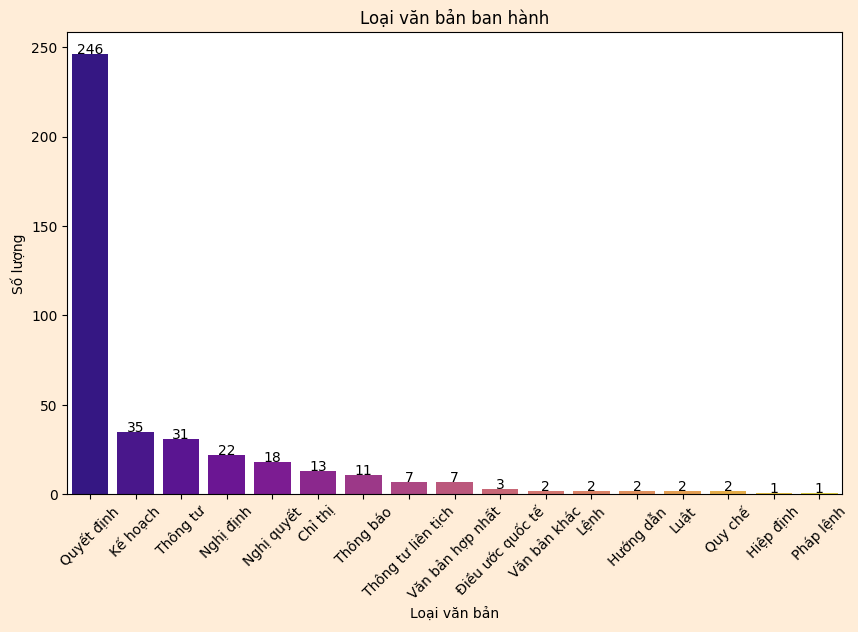

In [15]:
loai_van_ban_counts = df['loai_van_ban'].value_counts().sort_values(ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(x=loai_van_ban_counts.index, y=loai_van_ban_counts.values, palette='plasma')
# Thêm số lượng
for i in range(len(loai_van_ban_counts)):
    plt.text(i, loai_van_ban_counts.values[i], loai_van_ban_counts.values[i], ha = 'center')

plt.title('Loại văn bản ban hành')
plt.ylabel('Số lượng')
plt.xlabel('Loại văn bản')
plt.xticks(rotation=45)
plt.show()

- Thời gian ban hành của các loại luật ? Có những văn bản quá cũ không? 

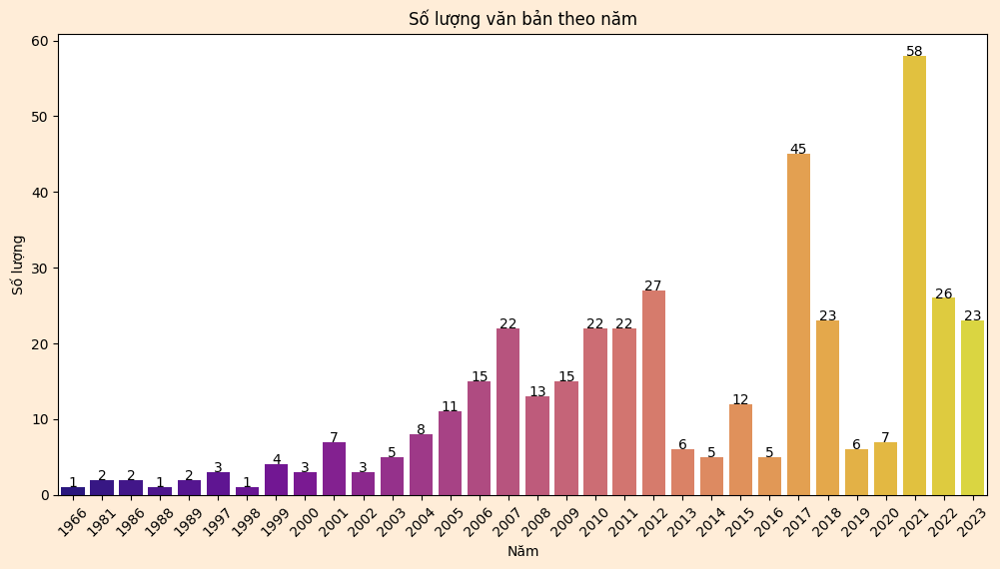

In [16]:
def extract_year(date_str):
    try:
        return int(date_str.split('/')[2])
    except:
        return None
    
years = df['ngay_ban_hanh'].apply(extract_year)

# Thống kê số lượng văn bản theo năm
year_counts = years.value_counts().sort_index()
# Biểu đồ số lượng văn bản theo năm
plt.figure(figsize=(12, 6))
sns.barplot(x=year_counts.index, y=year_counts.values, palette='plasma')

for i in range(len(year_counts)):
    plt.text(i, year_counts.values[i], year_counts.values[i], ha = 'center')

plt.title('Số lượng văn bản theo năm')
plt.ylabel('Số lượng')
plt.xlabel('Năm')
plt.xticks(rotation=45)
plt.show()

- Thống kê những nơi ban hành văn bản ?

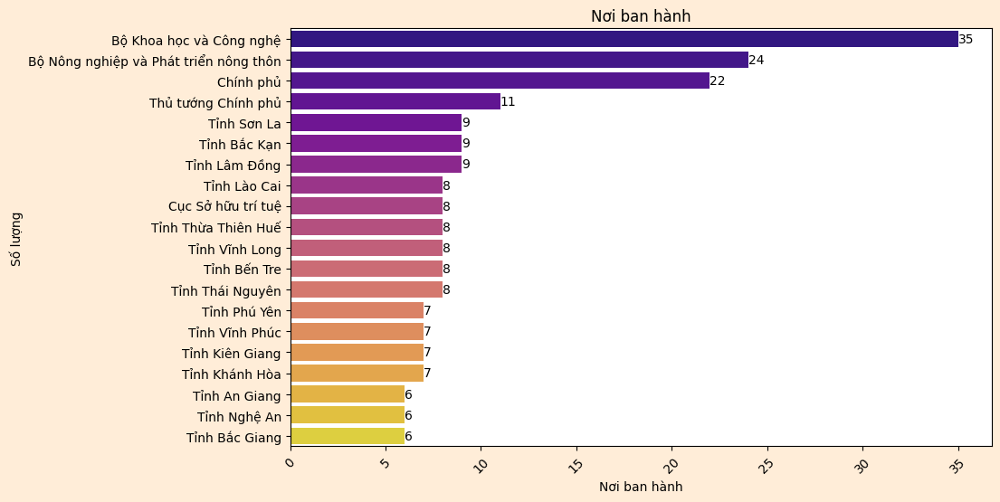

In [17]:
noi_ban_hanh_counts = df['noi_ban_hanh'].value_counts().sort_values(ascending=False).head(20)

plt.figure(figsize=(10, 6))
# biểu đồ barplot ngang
sns.barplot(x=noi_ban_hanh_counts.values, y=noi_ban_hanh_counts.index, palette='plasma')
# Thêm số lượng
for i in range(len(noi_ban_hanh_counts)):
    plt.text(noi_ban_hanh_counts.values[i], i, noi_ban_hanh_counts.values[i], va = 'center')
    

plt.title('Nơi ban hành')
plt.ylabel('Số lượng')
plt.xlabel('Nơi ban hành')
plt.xticks(rotation=45)
plt.show()


In [18]:
df['noi_dung_day_du'][0]

'THỦ TƯỚNG CHÍNH  PHỦ  ----------: Số: 88/QĐ-TTg\n\nCỘNG HÒA XÃ HỘI  CHỦ NGHĨA VIỆT NAM  Độc lập - Tự do - Hạnh phúc  ---------------: Hà Nội, ngày 20  tháng 01 năm 2017\n \nQUYẾT ĐỊNH\nVỀ\r\nVIỆC PHÊ DUYỆT ĐỀ ÁN TĂNG CƯỜNG NĂNG LỰC QUẢN LÝ VÀ THỰC THI CÓ HIỆU QUẢ PHÁP LUẬT\r\nBẢO HỘ QUYỀN TÁC GIẢ, QUYỀN LIÊN QUAN ĐẾN NĂM 2020, ĐỊNH HƯỚNG ĐẾN NĂM 2025\nTHỦ TƯỚNG CHÍNH PHỦ\nCăn cứ Luật tổ chức Chính phủ ngày 19 tháng 6\r\nnăm 2015;\nCăn cứ Luật sở hữu trí tuệ ngày 29 tháng 11 năm\r\n2005 và Luật sửa đổi, bổ sung một số điều của Luật sở hữu trí tuệ ngày 19 tháng\r\n6 năm 2009;\nCăn cứ Nghị quyết số 33-NQ/TW ngày 09 tháng 6\r\nnăm 2014 của Hội nghị lần thứ chín Ban Chấp hành Trung ương Đảng khóa XI về xây\r\ndựng và phát triển văn hóa, con người Việt Nam đáp ứng yêu cầu phát triển bền vững\r\nđất nước;\nCăn cứ Nghị quyết số 102/NQ-CP  ngày 31 tháng 12\r\nnăm 2014 của Chính phủ ban hành Chương trình hành động thực hiện Nghị quyết số\r\n33-NQ/TW ngày 9 tháng 6 năm 2014 của Hội nghị lần thứ 

### 2.2 Khám phá dữ liệu ở mức độ từ 

In [35]:
# Thư viện NLP cho tiếng Việt
# %pip install underthesea -q
from underthesea import word_tokenize, sent_tokenize, pos_tag, chunk, ner, classify
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation

# %pip install stopwordsiso -q
import stopwordsiso as stopwords

vietnamese_stopwords = stopwords.stopwords("vi")

# Với mối stop words có trên 2 từ thì nối lại bằng dấu _
vietnamese_stopwords = [stopword.replace(" ", "_") for stopword in vietnamese_stopwords]


In [36]:
def preprocess_text(text):
    # Chuyển văn bản thành chữ thường
    text = text.lower()
    
    # số lượng câu
    n_sentences = len(sent_tokenize(text))
    
    
    # Tách từ tiếng Việt -> sử dụng thư viện underthesea là một thư viện NLP cho tiếng Việt
    words = word_tokenize(text, format="text").split()
    # Lưu lại toàn bộ từ để giữ ngữ nghĩa
    
    full_words = " ".join(words)
    # loại bỏ stop words
    words = [word for word in words if word not in vietnamese_stopwords]
    
    # số lượng từ cụm từ chính trong văn bản
    n_words = len(words)
    
    processed_text = " ".join(words)
    


    results = {
    
        'n_sentences': n_sentences,
        'n_words': n_words,
        'full_words': full_words,
        'processed_text': processed_text
        
    }
    
    return results

In [37]:
statis_df = df['noi_dung_day_du'].apply(preprocess_text)
statis_df = pd.DataFrame(statis_df.tolist())
# nối vào df
df = pd.concat([df, statis_df], axis=1)

In [38]:
df['processed_text'][0]

'thủ_tướng chính_phủ ---------- : : 88 / qđ-ttg cộng_hòa xã_hội_chủ_nghĩa_việt_nam độc_lập - tự_do - hạnh_phúc --------------- : hà_nội , 20 01 2017 quyết_định phê_duyệt đề_án tăng_cường năng_lực quản_lý thực_thi hiệu_quả pháp_luật bảo_hộ quyền tác_giả , quyền liên_quan 2020 , định_hướng 2025 thủ_tướng chính_phủ căn_cứ luật tổ_chức chính_phủ 19 6 2015 ; căn_cứ luật sở_hữu_trí_tuệ 29 11 2005 luật sửa_đổi , bổ_sung một_số luật sở_hữu_trí_tuệ 19 6 2009 ; căn_cứ nghị_quyết 33 - nq / tw 09 6 2014 hội_nghị thứ chín ban_chấp_hành trung_ương_đảng khóa_xi xây_dựng phát_triển văn_hóa , con_người việt_nam đáp_ứng yêu_cầu phát_triển bền_vững đất_nước ; căn_cứ nghị_quyết 102 / nq-cp 31 12 2014 chính_phủ ban_hành chương_trình hành_động thực_hiện nghị_quyết 33 - nq / tw 9 6 2014 hội_nghị thứ chín ban_chấp_hành trung_ương_đảng khóa_xi xây_dựng phát_triển văn_hóa , con_người việt_nam đáp_ứng yêu_cầu phát_triển bền_vững đất_nước ; xét đề_nghị bộ_trưởng văn_hóa , thể_thao du_lịch , quyết_định : 1 . phê_d

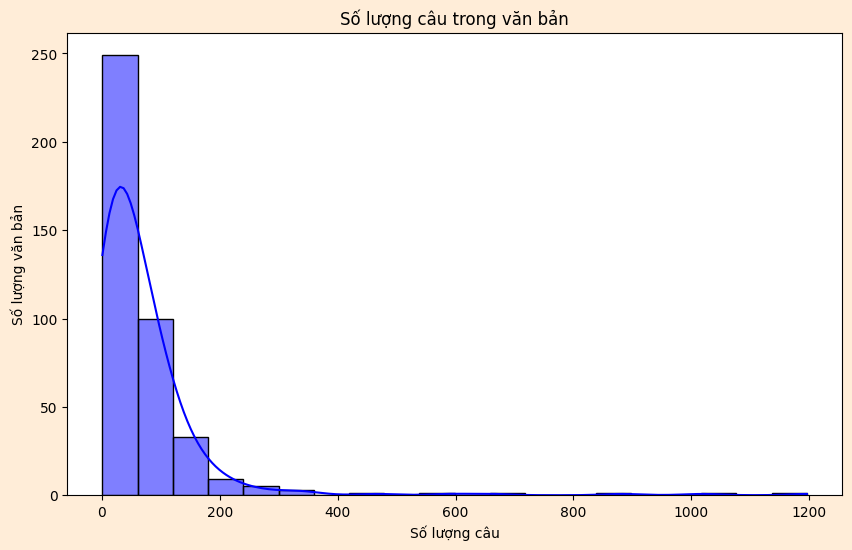

In [39]:
# số lượng câu trong văn bản
plt.figure(figsize=(10, 6))
sns.histplot(df['n_sentences'], bins=20, kde=True, color='blue')
plt.title('Số lượng câu trong văn bản')
plt.xlabel('Số lượng câu')
plt.ylabel('Số lượng văn bản')
plt.show()

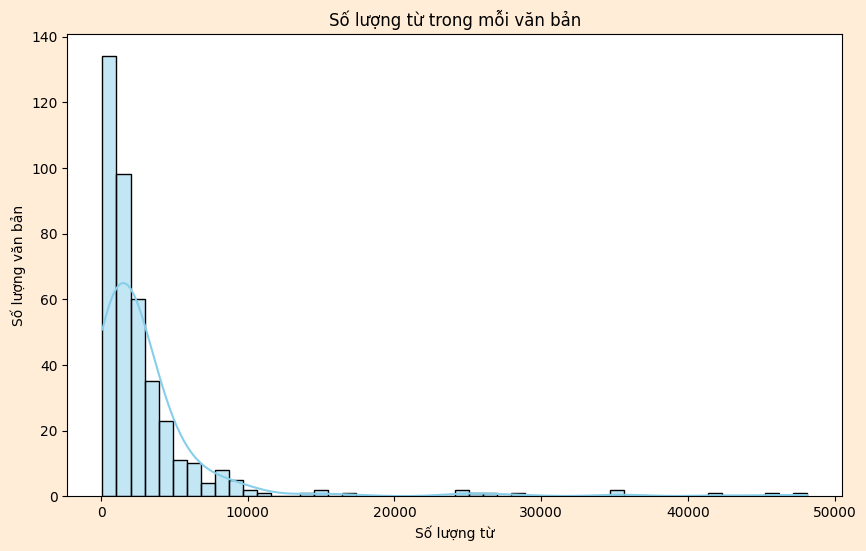

In [40]:
# Biểu đồ số lượng từ trong mỗi văn bản
plt.figure(figsize=(10, 6))
sns.histplot(df['n_words'], bins=50, kde=True, color='skyblue')
plt.title('Số lượng từ trong mỗi văn bản')
plt.xlabel('Số lượng từ')
plt.ylabel('Số lượng văn bản')
plt.show()

- Số lượng từ theo từng loại văn bản ?

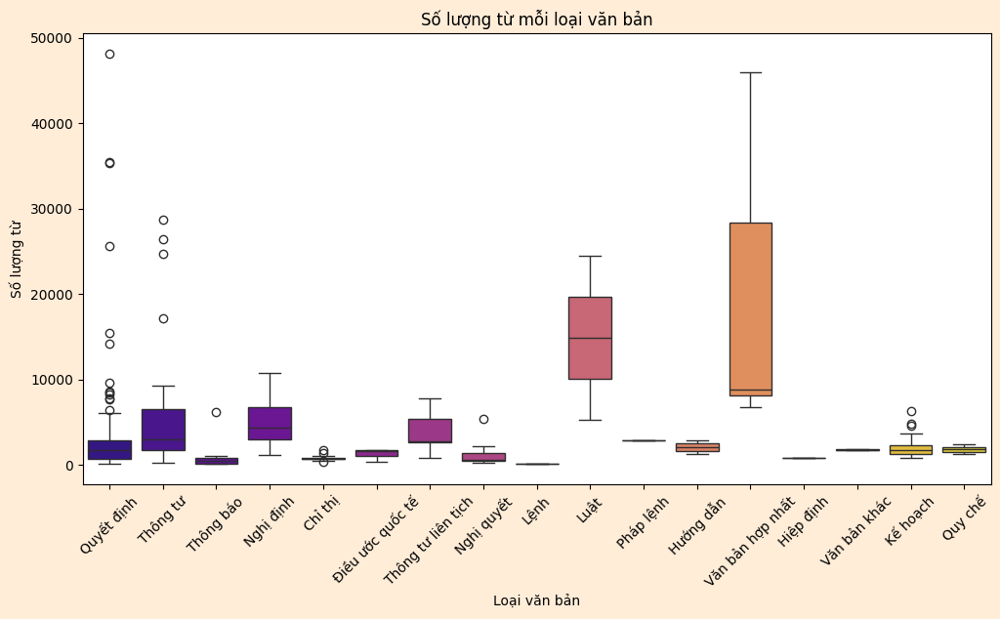

In [70]:
# Biểu đồ boxplot số lượng từ mỗi loại văn bản
plt.figure(figsize=(12, 6))
sns.boxplot(x='loai_van_ban', y='n_words', data=df, palette='plasma')
plt.title('Số lượng từ mỗi loại văn bản')
plt.xlabel('Loại văn bản')
plt.ylabel('Số lượng từ')
plt.xticks(rotation=45)
plt.show()

- Những từ phổ biên nhất trong dữ liệu theo từng loại văn bản

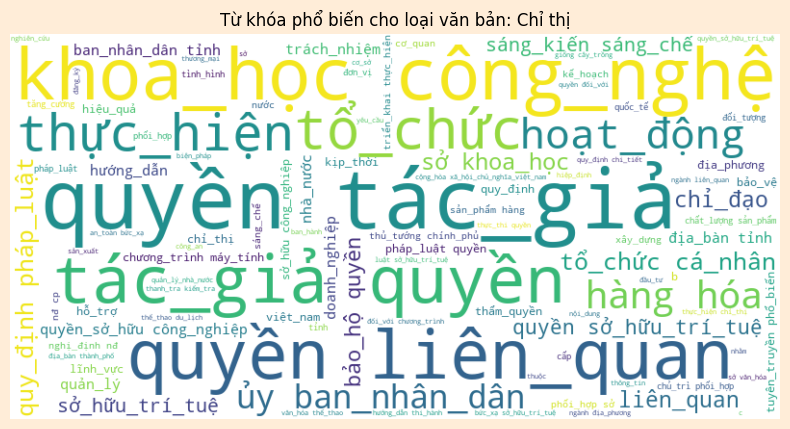

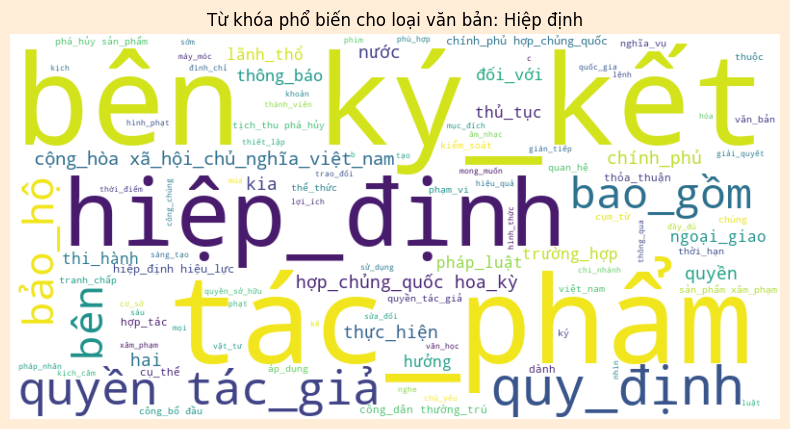

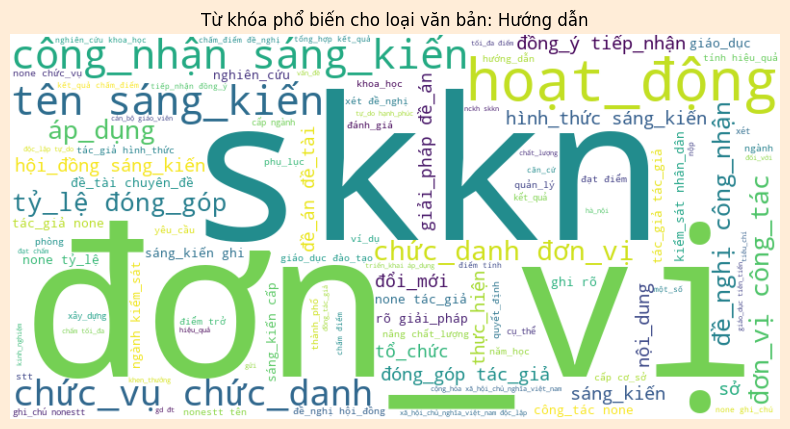

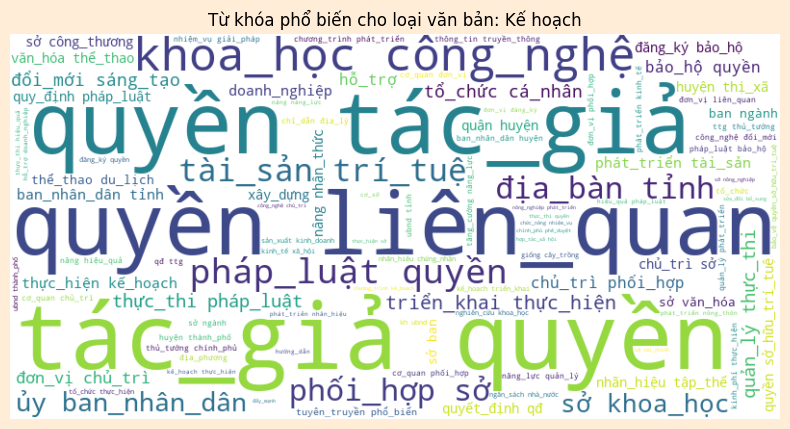

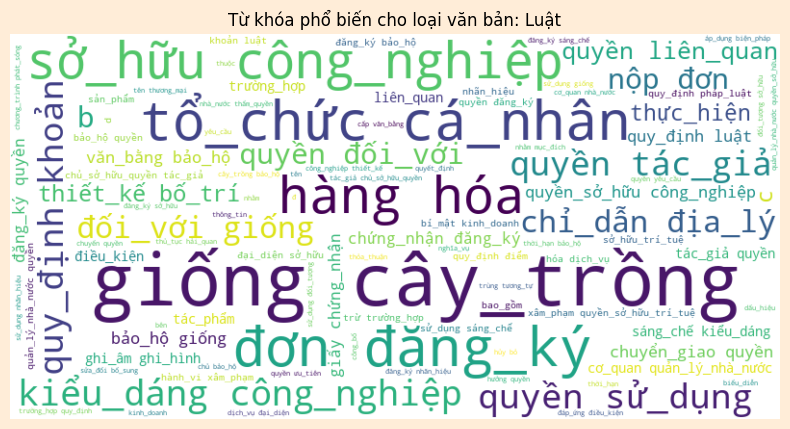

...

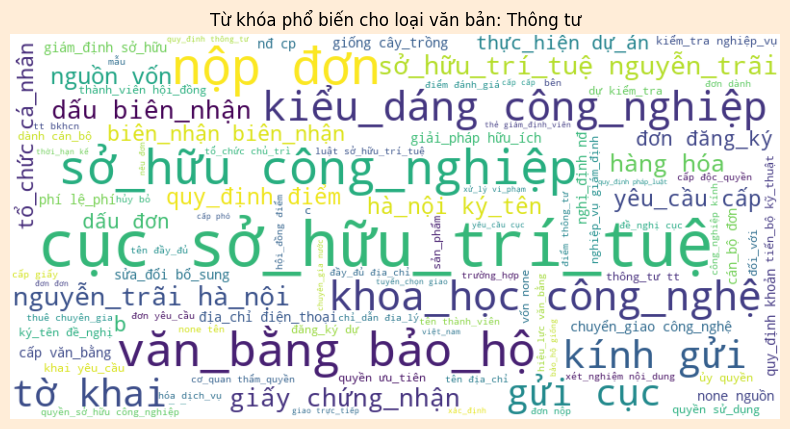

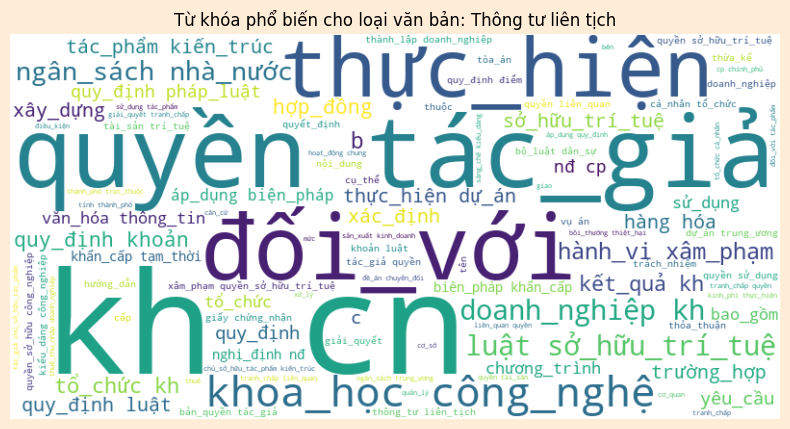

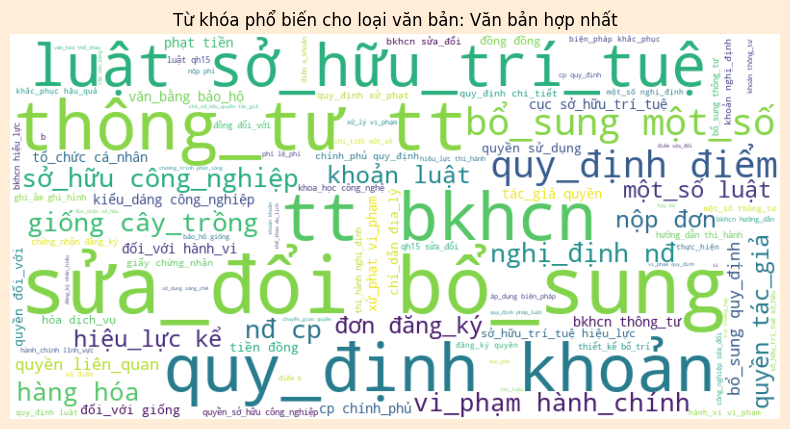

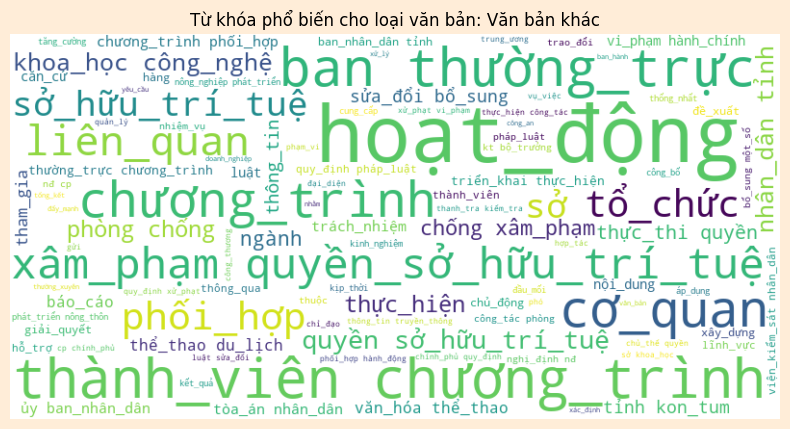

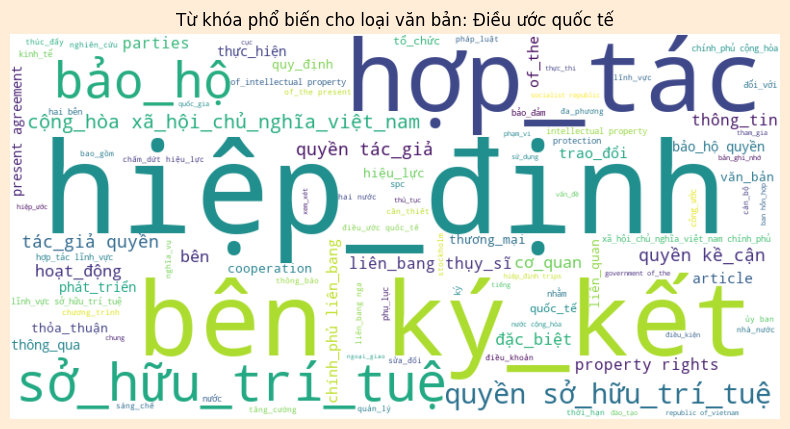

In [71]:
# %pip install wordcloud 
from wordcloud import WordCloud

grouped_text = df.groupby('loai_van_ban')['processed_text'].apply(lambda texts: ' '.join(texts))

# Tạo Word Cloud cho mỗi loại văn bản
for loai_vb, text in grouped_text.items():
    # Tạo word cloud
    wordcloud = WordCloud(width=800, height=400, background_color='white', max_words=100).generate(text)
    

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(f"Từ khóa phổ biến cho loại văn bản: {loai_vb}")
    plt.show()

### 2.3 Xây dựng ma trận TF-IDF

TF-IDF (Term Frequency-Inverse Document Frequency) là một kỹ thuật thống kê được sử dụng trong khai phá văn bản và truy xuất thông tin để đánh giá tầm quan trọng của một từ trong một tài liệu so với toàn bộ tập hợp tài liệu (corpus).

Công thức tính TF-IDF
TF-IDF của một từ \( t \) trong một tài liệu \( d \) thuộc tập hợp tài liệu \( D \) được tính bằng cách nhân TF (Term Frequency) với IDF (Inverse Document Frequency):

$$\text{TF-IDF}(t, d, D) = \text{TF}(t, d) \times \text{IDF}(t, D)$$

Term Frequency (TF)
TF đo lường tần suất xuất hiện của từ \( t \) trong tài liệu \( d \):

$$\text{TF}(t, d) = \frac{\text{số lần xuất hiện của từ } t \text{ trong tài liệu } d}{\text{tổng số từ trong tài liệu } d}$$

Inverse Document Frequency (IDF)
IDF đo lường mức độ quan trọng của từ \( t \) trong toàn bộ tập hợp tài liệu \( D \):

$$\text{IDF}(t, D) = \log \left( \frac{|D|}{|\{d \in D : t \in d\}|} \right)$$

Trong đó:

- \(|D|\) là số lượng tài liệu trong tập hợp tài liệu \(D\).
- \(|\{d \in D : t \in d\}|\) là số lượng tài liệu trong tập hợp tài liệu \(D\) mà từ \(t\) xuất hiện trong đó.

Ý nghĩa của TF-IDF
TF: Đo lường tần suất xuất hiện của từ trong một tài liệu cụ thể. Từ xuất hiện nhiều lần trong một tài liệu sẽ có giá trị TF cao.
IDF: Đo lường mức độ phổ biến của từ trong toàn bộ tập hợp tài liệu. Từ xuất hiện trong nhiều tài liệu sẽ có giá trị IDF thấp, và ngược lại, từ xuất hiện trong ít tài liệu sẽ có giá trị IDF cao.

Ý nghĩa tổng quát
TF-IDF giúp xác định tầm quan trọng của một từ trong một tài liệu cụ thể so với toàn bộ tập hợp tài liệu. Từ có giá trị TF-IDF cao thường là từ quan trọng và đặc trưng cho tài liệu đó, trong khi từ có giá trị TF-IDF thấp thường là từ phổ biến và ít đặc trưng.

TF-IDF thường được sử dụng trong các ứng dụng như tìm kiếm thông tin, phân loại văn bản, và khai phá dữ liệu văn bản.

In [76]:
from sklearn.feature_extraction.text import TfidfVectorizer

# Khởi tạo TfidfVectorizer
vectorizer = TfidfVectorizer()

# Tạo ma trận TF-IDF từ văn bản đã tiền xử lý
tfidf_matrix = vectorizer.fit_transform(df['processed_text'])

tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), columns=vectorizer.get_feature_names_out())

tfidf_df['loai_van_ban'] = df['loai_van_ban']
tfidf_df.head(3)


,00,000,0000,000065,000069,000081,000086,00009,00017,000184,00021,00033,00035,000419,000419_000,000457,00049,0006,00087,000895,000895_000,000905,000905_000,000912,000912_000,000935,000977,000_stt,000_triệu,000_đstt,000_đtt,000_đồng,001,001483,0019,002131,002254,0024,002799,002803,0032,003542,003542_stt,0036,0038,004,0045,0046,0047,0048,00484,005,00851,0087_tt,0088,0092,01,011936,011937,011938,011939,015,01539,0158_tt,017,0176,018,02,020,0204,0207,0210,025,026_hộ,02_cuộc,03,0302_tt,0346,035,0375,0391,039600,0399,03_cuộc,03_lớp,04,043,0445,046,0480,0483,0498_tt,04_,04_tóm,05,050,050298,050_stt,0538,055,0552_tt,056,058,05_đơn,06,060,0606,07,0715_tt,075,076,0768,08,080,0806,0823,09,090,0_2,0_chương,0_cm,0_stt,10,100,1000,100000,1000000,10000000,1003542,10062,100_điểm,101,1012,10120,10147,102,1026,10260000,103,1037,104,105,1050000,1051,1054,1058,106,1060,10618,1062,1068,106880000,107,10780,108,109,1094,10_n,10_đơn,11,110,11000,1100000,1102,110_stt,111,1110,112,1121,1123,11280000,113,1130,1131,1136,1137,114,1147,115,1151,1154,116,1162,117,118,1180,1183,1185,119,1190,1194,1196,1199,11_,11_điểm,12,120,120000,1200000,12000000,1203,121,1211,1212,1215,122,1221,12280000,123,124,1244,1246,1247,124_đơn,125,1259,126,1267,127,1273,128,1280,1288,129,1291,1296,12_,12_n,13,130,13000,131,1312,132,133,1331,1333,1335,134,1348,135,1357,135970000,136,1361,1363,1365,137,1370,13740000,1375,1377,1378,138,13863,1389,139,1398,1399,13_g,13_quyền,14,140,1400,14000,140000,1400000,14060,140600000,141,1410,1411,1411_tt,14135,1415,1418,142,143,1432,1439,144,145,146,1464,147,1476,148,1485,1486,149,1490,15,150,1500,15000,150000,1500000,15000000,151,1514,1517,1518,152,1525,153,1530,1535,1537,154,155,1551,156,1566,157,1574,1579,158,1580,1582,159,1595,15_,16,160,160000,1600000,16000000,161,1618,162,1623,163,1634,1637,163800,164,165,165400,166,1660,167,1670,168,1680000,169,1692,1693,16_cm,17,170,1702,1705,171,172,1721,1727,173,1731,174,1746,1748,175,1751,1758,176,1762,177,1773,1778,1779,178,1783,1787,1789,179,1790,1792,1799,17_cm,17_n,17_tác_giả,18,180,1800,180000,1800000,18000000,1807,18091,181,1810,1813,1817,1818,1819,182,1826,183,184,185,1852,186,18640,187,1876,1877,1879,188,1883,1885,1886,189,1891,1893,1895,18_n,18_điểm,19,190,1901,191,1910,1911,192,1920,19200,1921,1925,193,194,1941,1945,195,1951,1952,19530,1954,1956,1957,196,1960,1961,1962,1963,1965,1966,1967,1968,1968_n,197,1970,1971,1972,1974,1975,1977,1979,198,1980,1981,1982,1984,1985,1986,1987,1988,1989,199,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,19_,19_g,19_phí,1_a,1_b,1_chủ,1_cục,1_lít,1_lọ,1_mẫu,1_mọi,1_mục,1_n,1_phiếu,1_sổ,1_trình_tự,1_tùy,1_điều,1_đơn,1a,1b,20,200,2000,20000,200000,2000000,200000000,200098,2001,2002,2003,2004,2005,2006,2007,2008,2008_01,2009,2009_09,2009_10,2009_11,2009_12_số,2009_14_số,2009_15_số,2009_31,2009_39,2009_43,201,2010,2010_46,2010_47,2010_49,2010_50,2010_b,2010_c3,2011,2011_15,2011_21,2011_22,2011_3,2011_42,2012,2013,2013_hợp,2014,2015,2016,2016_mã,2017,2017_phí,2018,2018_cục,2019,202,2020,2020_b,2020_cục,2020_stt,2021,20219,2021_stt,2022,2023,2023_stt,2024,2025,2026,2027,2028,2029,203,2030,2035,2037,204,2040000,2042,2045,2046,2047,2048,2049,205,2050,206,2060,2061,207,2070,2071,2077,208,2084,209,2099,20_cục,20_n,20_điểm,20yy,21,210,21000,210115,211,2116,212,2120,213,2137,214,2143,2147,215,2156,2159,216,216000000,2161,217,218,219,2198,21_n,22,220,2200,22000,2204,2205,220_stt,221,2217,222,2221,2222,2225,223,2230,2231,224,225,22500000,225000000,2259,226,226497,226498,226499,2265,226502,227,2276,2288,229,22_n,23,230,2301,23010000,2302,2306,2309,23099,232,2325,233,2341,2344,2346,2359,236,236000000,23777,238,2388,2391,2397,24,240,2400,240000,2400000,2400000000,2402,242,2420,242000,242060,2421,2431,244,2441,2443,2445,245,246,2460000,2465,2472,2476,2488,249,24_điểm,25,250,2500,25000000,250000000,250_stt,251,2514,252,25200000,253,2538,254,2543,2545,254940,2553,2561,257,2575,2579,258,2587,259,25_cm,25_n,25_trưởng,26,260,26000,2607,260959,261,2612,263,26300,2636,2638,2654,266

- Các từ quan trọng nhất theo từng loại văn bản

In [77]:
tfidf_mean = tfidf_df.groupby('loai_van_ban').mean()

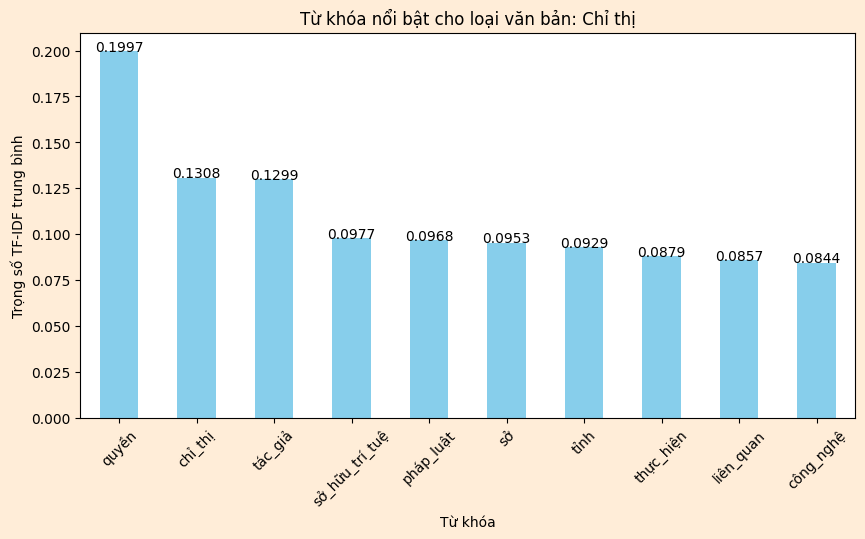

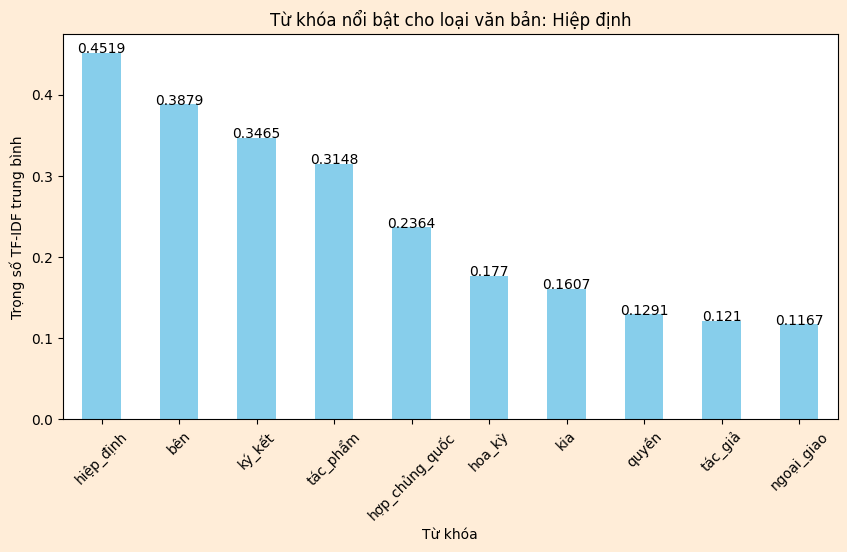

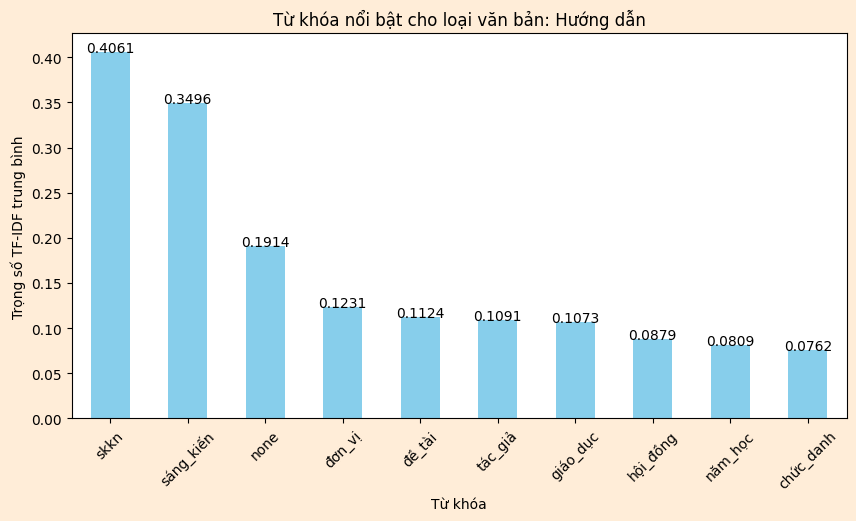

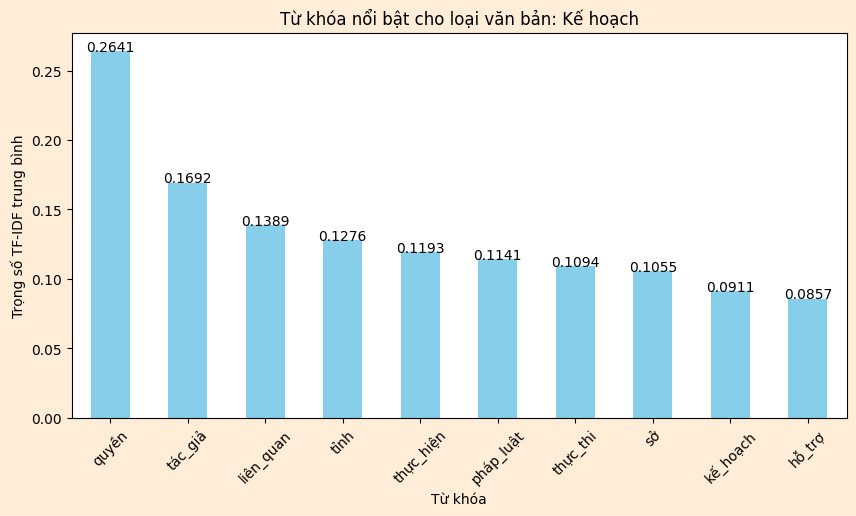

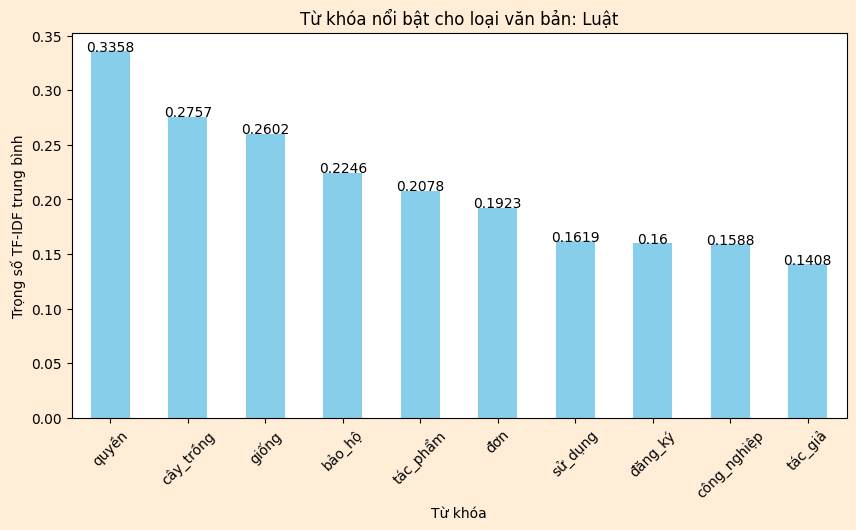

...

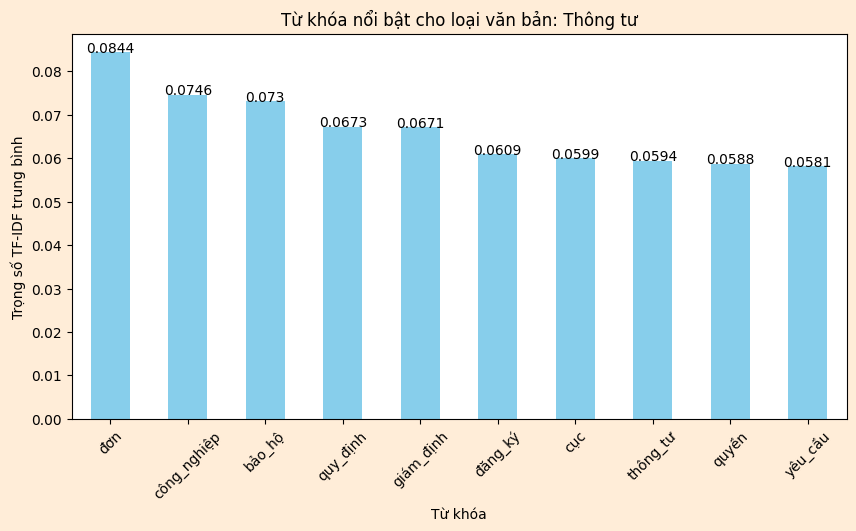

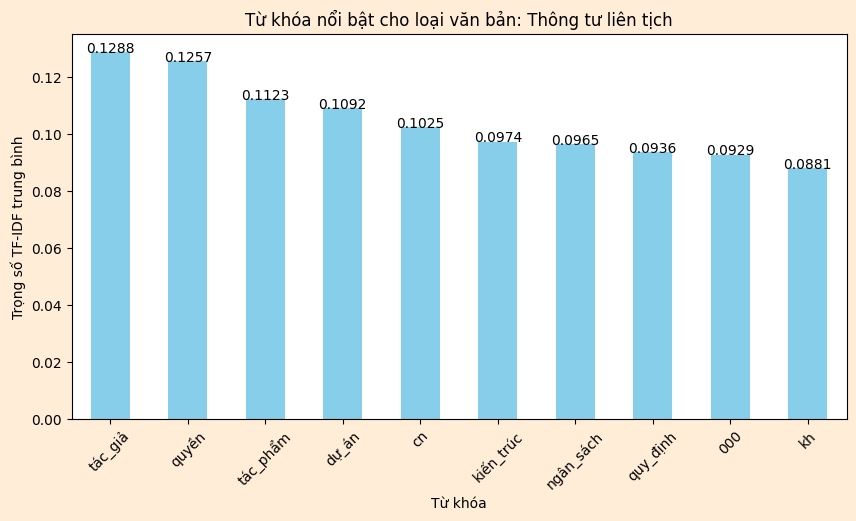

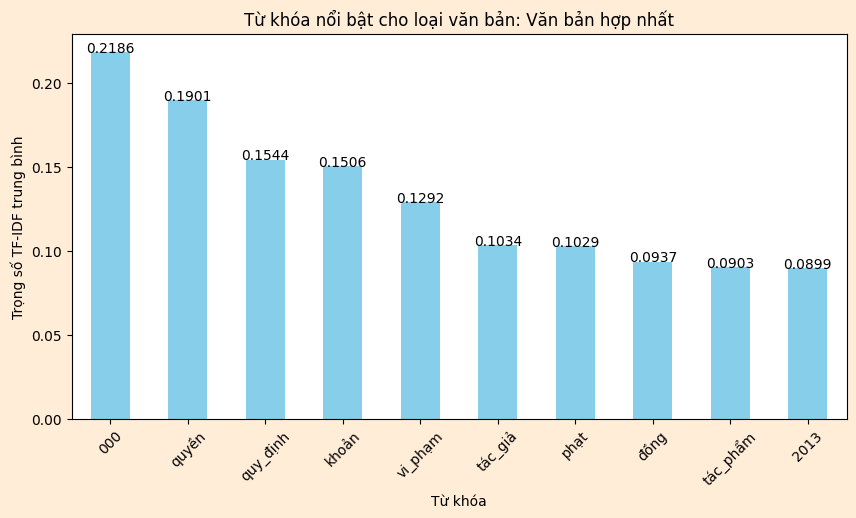

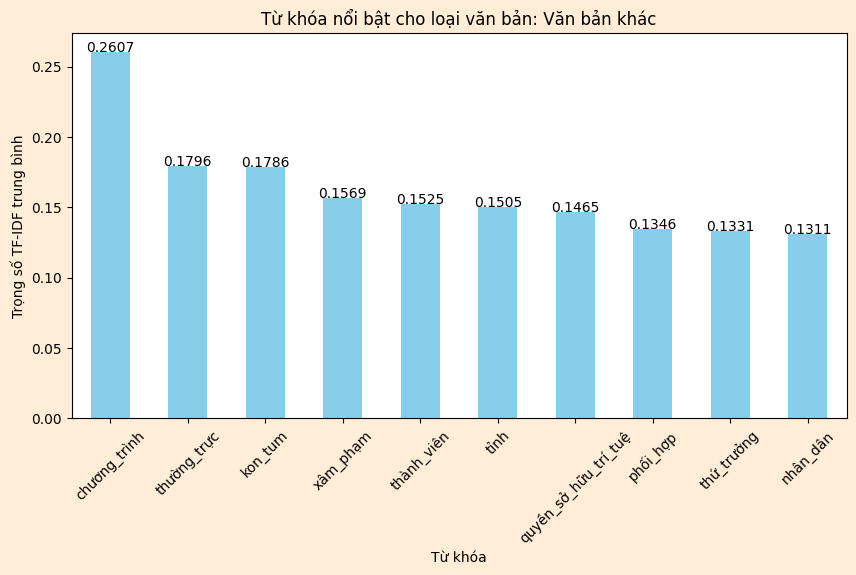

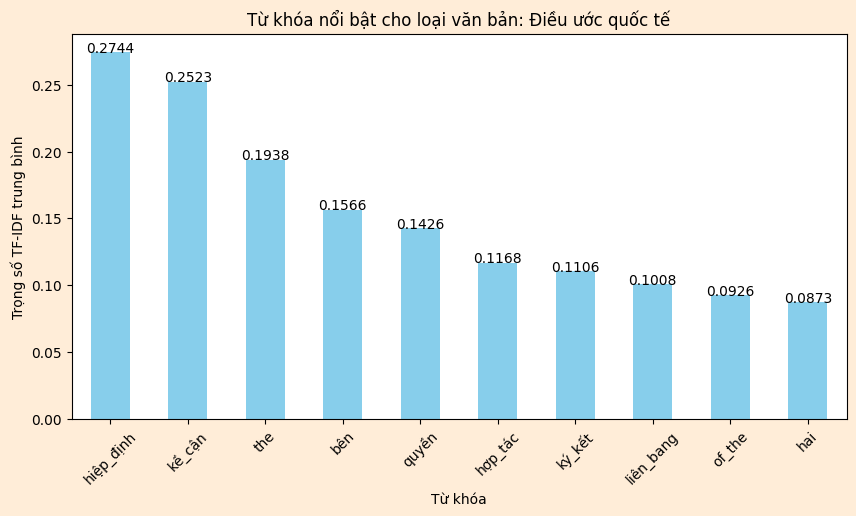

In [78]:

for loai_vb in tfidf_mean.index:
    top_words = tfidf_mean.loc[loai_vb].sort_values(ascending=False).head(10)
    plt.figure(figsize=(10, 5))
    top_words.plot(kind='bar', color='skyblue')
    # điền số liệu
    for i in range(len(top_words)):
        plt.text(i, top_words.values[i], round(top_words.values[i], 4), ha = 'center')
    
    plt.title(f"Từ khóa nổi bật cho loại văn bản: {loai_vb}")
    plt.xlabel("Từ khóa")
    plt.ylabel("Trọng số TF-IDF trung bình")
    plt.xticks(rotation=45)
    plt.show()


### 2.4 Phân cụm dữ liệu

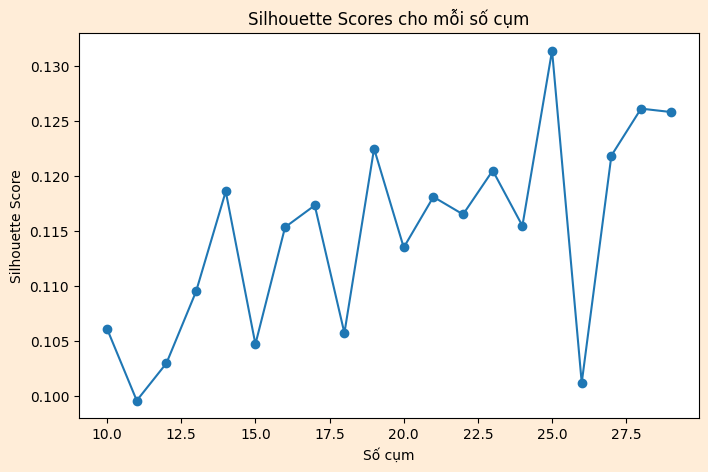

In [75]:

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

# Lưu trữ các giá trị silhouette cho mỗi số cụm
silhouette_scores = []
num_clusters_range = range(10,30)


# Thử nghiệm số cụm từ 5 đến 12
for num_clusters in num_clusters_range:
    kmeans = KMeans(n_clusters=num_clusters, random_state=0)
    kmeans.fit(tfidf_matrix)
    score = silhouette_score(tfidf_matrix, kmeans.labels_)
    silhouette_scores.append(score)

# Vẽ biểu đồ silhouette scores để tìm số cụm tối ưu
plt.figure(figsize=(8, 5))
plt.plot(num_clusters_range, silhouette_scores, marker='o')
plt.title("Silhouette Scores cho mỗi số cụm")
plt.xlabel("Số cụm")
plt.ylabel("Silhouette Score")
plt.show()

## III. Một số mô hình NLP cho dữ liệu

### 3.1 Mô hình N-gram
Mô hình N-gram là một kỹ thuật trong xử lý ngôn ngữ tự nhiên (NLP) và học máy, được sử dụng để dự đoán từ hoặc chuỗi từ tiếp theo trong một văn bản dựa trên các từ hoặc chuỗi từ trước đó. "N" trong N-gram đại diện cho số lượng từ trong chuỗi.

In [13]:
from collections import defaultdict
import random

# Tạo từ điển để lưu tần suất của các N-grams
bigram_freq = defaultdict(int)
unigram_freq = defaultdict(int)

# Tạo N-grams
for text in df['full_words']:
    words = text.split() 
    
    for i in range(len(words) - 1):
        unigram_freq[words[i]] += 1
        bigram_freq[(words[i], words[i + 1])] += 1
    
    # Cập nhật cho từ cuối cùng trong câu
    unigram_freq[words[-1]] += 1

# Kiểm tra tần suất
print("Tần suất Unigram:", dict(unigram_freq))
print("Tần suất Bigram:", dict(bigram_freq))

Tần suất Unigram: {'thủ_tướng': 302, 'chính_phủ': 1995, '----------': 3, ':': 54718, 'số': 8960, '88': 64, '/': 11464, 'qđ-ttg': 235, 'cộng_hòa': 669, 'xã_hội_chủ_nghĩa_việt_nam': 666, 'độc_lập': 817, '-': 13802, 'tự_do': 535, 'hạnh_phúc': 528, '---------------': 369, 'hà_nội': 805, ',': 86354, 'ngày': 10776, '20': 692, 'tháng': 4756, '01': 1962, 'năm': 7607, '2017': 407, 'quyết_định': 4873, 'về': 10849, 'việc': 5158, 'phê_duyệt': 1018, 'đề_án': 531, 'tăng_cường': 621, 'năng_lực': 519, 'quản_lý': 4682, 'và': 33765, 'thực_thi': 859, 'có': 15218, 'hiệu_quả': 1257, 'pháp_luật': 2898, 'bảo_hộ': 6851, 'quyền': 11917, 'tác_giả': 4588, 'liên_quan': 5679, 'đến': 5211, '2020': 709, 'định_hướng': 290, '2025': 324, 'căn_cứ': 2556, 'luật': 4087, 'tổ_chức': 11546, '19': 478, '6': 2135, '2015': 371, ';': 16971, 'sở_hữu_trí_tuệ': 7366, '29': 317, '11': 1218, '2005': 234, 'sửa_đổi': 3263, 'bổ_sung': 3262, 'một_số': 2214, 'điều': 11566, 'của': 27080, '2009': 194, 'nghị_quyết': 314, '33': 123, 'nq': 22,

In [14]:
def calculate_bigram_probability(word1, word2):
    # Tính xác suất có điều kiện cho bigram (word1, word2)
    if unigram_freq[word1] == 0:
        return 0
    return bigram_freq[(word1, word2)] / unigram_freq[word1]

In [15]:

def format_start_phrase(start_phrase):
    # Chuẩn hóa cụm từ đầu vào
    start_phrase = start_phrase.lower()
    
    words = word_tokenize(start_phrase, format="text").split()
    
    start_phrase = " ".join(words)
    return start_phrase

def generate_text(start_phrase, length=10):
    # Tách từ trong cụm từ đầu vào
    words = format_start_phrase(start_phrase).split()
    
    for _ in range(length):
        # Tìm các từ có thể xuất hiện tiếp theo
        next_words = [word2 for (word1, word2) in bigram_freq.keys() if word1 == words[-1]]
        
        if not next_words:
            break
        
        # Tính xác suất của các từ tiếp theo
        probabilities = [calculate_bigram_probability(words[-1], next_word) for next_word in next_words]
        
        # Chọn từ tiếp theo dựa trên xác suất
        next_word = random.choices(next_words, probabilities)[0]
        words.append(next_word)
    
    return ' '.join(words)





In [19]:
start_phrase = 'cộng hoà'

response = generate_text(start_phrase, length=40)
print(response)

cộng hòa giải được công_nhận sáng_kiến đối_với đăng_ký hoạt_động thực_thi về kết_cấu các mối liên_quan đến 70.000.000 đồng đến 300.000.000 đồng . 3 . 2 : giờ làm_việc theo đáp_án và sự hình_thành , kết_luận giám_định về quyền tài_sản trí_tuệ nhằm mục_đích
